(learning)=
# Learning

With {numref}`Chapter %s <information-theory>` on information theory, {numref}`Chapter %s <optim>` on optimization, and {numref}`Chapter %s <prob-models>` on probabilistic graphical models all under our belt, we have covered all the prerequisites needed to finally implement the criterion from {numref}`learning-optim` for choosing optimal parameters for our probabilistic graphical models:

> **The Distance Criterion for Parameter Choice.** Given two model distributions within the same family of probabilistic models, choose the model distribution whose _distance_ from the empirical distribution of the data is smaller.

In more detail, we suppose that we are given a fixed dataset. We then choose a family of probabilistic graphical models that we believe might model the dataset well---possibly one of the families described in {numref}`Chapter %s <prob-models>`, or maybe one of those described in the [programming assignments](https://github.com/jmyers7/stats-book-materials/tree/main/programming-assignments) for {numref}`Chapter %s <prob-models>` or the current chapter. But no matter which family of PGMs that we happen to choose, there will be a proposed model probability distribution $P_{\btheta}$ that depends on a parameter vector $\btheta$; for example, in the case of a [logistic regression model](log-reg-sec), the (total) parameter vector is given by

$$
\btheta = (\beta_0,\bbeta),\quad \beta_0\in \bbr, \ \bbeta \in \bbr^n.
$$

According to the Distance Criterion for Parameter Choice stated above, we are to choose the parameter vector $\btheta$ that minimizes the distance from the model distribution to the empirical distribution of the data. Once more, the following cartoon visually depicts this goal, where $p(\bx,y;\btheta)$ is the mass function of the proposed model distribution and $\hat{p}(\bx,y)$ is the mass function of the empirical distribution:

```{image} ../img/prob-distance.svg
:width: 75%
:align: center
```
&nbsp;

As we now know from our study of {numref}`Chapter %s <information-theory>`, a natural candidate for the "distance" between two distributions is the KL divergence. So, our implementation of the Distance Criterion requires us to minimize KL divergences thought of as functions of model parameters $\btheta$; for this, the iterative, gradient-based algorithms from {numref}`Chapter %s <optim>` will prove highly useful.

However, as we will see beginning in the [first section](likelihood-learning-sec) of this chapter, this optimization objective may be equivalently reformulated as one of several other optimization objectives. In particular, minimizing the KL divergence from the model distribution to the empirical distribution will turn out to yield the same parameter vector $\btheta$ as minimizing the cross entropy from the former to the latter. The advantage that the cross entropy formulation carries is that it is a _stochastic_ objective, which opens the door for the powerful stochastic gradient descent algorithm studied in {numref}`sgd-sec`. But the loss function associated with this stochastic objective is nothing but the _surprisal function_ (in the sense of {prf:ref}`info-content-def`) thought of as a function of the parameter vector $\btheta$, and so our optimization objective may reformulated (again) as seeking the parameter vector $\btheta$ that minimizes the average surprisal. In turn, the surprisal function is simply the negative logarithm of the probability mass function as a function of $\btheta$, which is nothing but the _model likelihood function_ familiar to us from {numref}`Chapter %s <prob-models>`. So, our optimization objective may be reformulated (one more time) as seeking the parameter vector $\btheta$ that maximizes the average model likelihood. Due to the equivalencies with this last reformulation, all these optimization objectives fall under the heading of _likelihood-based learning objectives_, and the specific realization of the Distance Criterion for Parameter Choice in terms of these objectives is called _maximum likelihood estimation_ or _MLE_.

All of this will be introduced and described concretely in the case of a very simple univariate PGM in the [first section](likelihood-learning-sec) below. Then, in {numref}`gen-mle-sec`, we describe MLE for general PGMs, taking care to distinguish between models trained as _generative_ versus _discriminative models_, with the latter type further separated into those with continuous versus discrete response variables. The remaining three sections in the chapter address the specific cases of MLE for the three types of PGMs studied in {numref}`Chapter %s <prob-models>`: Linear regression models in {numref}`mle-lin-reg-sec`, logistic regression models in {numref}`mle-log-reg-sec`, and neural network models in {numref}`mle-nn-sec`.



(likelihood-learning-sec)=
## A first look at likelihood-based learning objectives

To help motivate the general likelihood-based learning objectives studied in this chapter, let's begin with a simple example. Suppose that we have an observed dataset

$$
x_1,x_2,\ldots,x_m \in \{0,1\}
$$

drawn from a random variable $X \sim \Ber(\theta)$ with unknown parameter $\theta \in [0,1]$. This is a very simple example of a probabilistic graphical model whose underlying graph consists of only two nodes, one for the parameter $\theta$ and one for the (observed) random variable $X$:

```{image} ../img/bern-pgm.svg
:width: 18%
:align: center
```
&nbsp;

The probability measure $P_\theta$ proposed by the model has mass function

$$
p(x;\theta) = \theta^x (1-\theta)^{1-x},
$$ (bern-model-eq)

for $x\in \{0,1\}$, while the dataset has its empirical probability measure $\hat{P}$ with mass function $\hat{p}(x)$ defined as

$$
\hat{p}(x) = \frac{\text{frequency of $x$ in the dataset}}{m} = \begin{cases}
\displaystyle\frac{\Sigma x}{m} & : x=1, \\
\displaystyle\frac{m - \Sigma x}{m} & : x=0,
\end{cases}
$$ (bern-empirical-eq)

where $\Sigma x \def x_1 + x_2 + \cdots + x_m$. The goal, of course, is to model the observed dataset with our univariate PGM, but the parameter $\theta$ is unknown. An "optimal" value for the parameter will minimize the discrepancy (or "distance") between the two distributions $\hat{P}$ and $P_\theta$. We seek to "learn" this optimal value from the dataset.

```{margin}

Technically, according to {prf:ref}`KL-def`, in order to discuss the KL divergence we must require that the empirical distribution is absolutely continuous with respect to the model distribution, in the sense that $p(x;\theta)=0$ implies $\hat{p}(x)=0$ for all $x$. This may create some minor headaches that require addressing special cases in proofs. For an example, see the proof of {prf:ref}`bern-mle-thm` below.
```

Of course, by now we know that "distance" means KL divergence, so the goal is to locate the minimizer

$$
\theta^\star = \argmin_{\theta\in [0,1]} D(\hat{P} \parallel P_\theta).
$$

But from {prf:ref}`KL-and-entropy-thm`, the KL divergence may be expressed as a difference of two entropies,

$$
D(\hat{P} \parallel P_\theta) = H_{\hat{P}}(P_\theta) - H(\hat{P}),
$$

and since the entropy $H(\hat{P})$ does not depend on $\theta$ it may be dropped from the optimization objective, and we see that we are equivalently searching for the minimizer of cross entropy:

$$
\theta^\star = \argmin_{\theta\in [0,1]} H_{\hat{P}}(P_\theta).
$$

Let's unpack this cross entropy, using {eq}`bern-model-eq` and {eq}`bern-empirical-eq`. By definition, we have

$$
H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ I_{P_\theta}(x) \right],
$$ (cross-ent-stoch-eq)

where

$$
I_{P_\theta}(x) = -\log\left[ p(x;\theta) \right]
$$

is the surprisal function (see {prf:ref}`info-content-def`). Because we want to think of the data as being fixed and the parameter as variable, it will be convenient to define the _model surprisal function_ to be

$$
\calI(\theta;x) \def -\log\left[ p(x;\theta) \right],
$$

with the parameter $\theta$ written first, similar to our convention regarding likelihood functions in {numref}`Chapter %s <prob-models>`. In fact, if we define the _model likelihood function_ of our univariate Bernoulli model to be

$$
\calL(\theta;x) \def p(x;\theta),
$$

then the model surprisal function is nothing but the negative logarithm of the model likelihood function.

Now, note that

$$
p(x_1,\ldots,x_m; \theta) = \prod_{i=1}^m p(x_i;\theta),
$$ (bern-like-factor-eq)

since the dataset is assumed drawn from an IID random sample. If we define the left-hand side to be the _data likelihood function_,

$$
\calL(\theta;x_1,\ldots,x_m) \def p(x_1,\ldots,x_m; \theta),
$$

then we may rewrite {eq}`bern-like-factor-eq` in terms of likelihood functions as

$$
\calL(\theta;x_1,\ldots,x_m) = \prod_{i=1}^m \calL(\theta; x_i).
$$ (bern-like-factor-2-eq)

(Notice that this is _identical_ to the factorizations of likelihood functions studied in {numref}`Chapter %s <prob-models>`.) Finally, if we define the _data surprisal function_ to be

$$
\calI(\theta;x_1,\ldots,x_n) \def - \log\left[ p(x_1,\ldots,x_m; \theta) \right] = - \log\left[ \calL(\theta;x_1,\ldots,x_m)\right],
$$

then we may apply the negative logarithm to both sides of {eq}`bern-like-factor-2-eq` to get the fundamental equation

$$
\calI(\theta;x_1,\ldots,x_n) = \sum_{i=1}^m \calI(\theta;x_i)
$$ (data-model-surprise-bern-eq)

expressing the data surprisal function as a sum of model surprisal functions.

Let's now bring back the cross entropy expressed above as {eq}`cross-ent-stoch-eq`. Using the model surprisal function, we may write:

$$
H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ \calI(\theta; x) \right] = \sum_{x\in \bbr} \hat{p}(x) \calI(\theta;x) = \frac{1}{m} \sum_{i=1}^m \calI(\theta;x) = \frac{1}{m} \calI(\theta;x_1,\ldots,x_m).
$$

So, putting everything together, we get that

$$
D(\hat{P} \parallel P_\theta) + H(\hat{P}) = H_{\hat{P}}(P_\theta) = E_{x \sim \hat{p}(x)} \left[ \calI(\theta; x) \right] \propto \calI(\theta; x_1,\ldots,x_m),
$$

where the constant of proportionality is the (positive) number $1/m$. Moreover, since the negative logarithm function is strictly decreasing, minimizing the data surprisal function with respect to $\theta$ is equivalent to maximizing the data likelihood function with respect to $\theta$ (see the [homework](https://github.com/jmyers7/stats-book-materials/blob/main/homework/13-homework.md#problem-1-negative-logarithms-and-optimization)). So, if we combine all of our observations into a single theorem, we get:

```{margin}

As mentioned in the margin note above, in this theorem we are implicitly restricting our attention to those parameters $\theta$ for which the empirical distribution $\hat{P}$ is absolutely continuous with respect to the model distribution $P_\theta$.
```

```{prf:theorem} Equivalent learning objectives for the univariate Bernoulli model
:label: equiv-obj-bern-thm

Let $x_1,x_2,\ldots,x_m \in \{0,1\}$ be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Let $P_\theta$ be the model distribution of $X$ and let $\hat{P}$ be the empirical distribution of the dataset. The following optimization objectives are equivalent:

1. Minimize the KL divergence $D(\hat{P} \parallel P_\theta)$ with respect to $\theta$.
2. Minimize the cross entropy $H_{\hat{P}}(P_\theta)$ with respect to $\theta$.
3. Minimize the data surprisal function $\calI(\theta; x_1,\ldots,x_m)$ with respect to $\theta$.
4. Maximize the data likelihood function $\calL(\theta; x_1,\ldots,x_m)$ with respect to $\theta$.
```

Though these optimization objectives are all equivalent to each other, they have different interpretations, conceptualizations, and advantages:

> 1. Minimizing the KL divergence between the empirical and model distributions has an immediate and concrete interpretation as minimizing the "distance" between these two distributions.
> 2. As a function of $\theta$, the cross entropy $J(\theta) = H_{\hat{P}}(P_\theta)$ may be viewed as a stochastic objective function, since it is exactly the mean of the model surprisal function. This opens the door for applications of the stochastic gradient descent algorithm studied in {numref}`sgd-sec`.
> 3. The third optimization objective seeks the model probability distribution according to which the data is _least surprising_.
> 4. The fourth optimization objective seeks the model probability distribution according to which the data is _most likely_.

Due to the equivalence with the fourth optimization objective, all these optimization objectives are referred to as _likelihood-based learning objectives_. The optimization process is then called _maximum likelihood estimation_ (*MLE*), and the value

\begin{align*}
\theta^\star_\text{MLE} &\def \argmax_{\theta \in [0,1]} \calL(\theta; x_1,\ldots,x_m) \\
&= \argmin_{\theta \in [0,1]} \calI(\theta; x_1,\ldots,x_m) \\
&= \argmin_{\theta \in [0,1]} H_{\hat{P}}(P_\theta) \\
&= \argmin_{\theta \in [0,1]} D(\hat{P} \parallel P_\theta)
\end{align*}

is called the _maximum likelihood estimate_ (also _MLE_). But in actual real-world practice, nobody _ever_ maximizes the likelihood function directly due to numerical instability (and other reasons), and instead one of the other three learning objectives is used.

It will turn out that a version of {prf:ref}`equiv-obj-bern-thm` holds for all probabilistic graphical models with discrete model distributions, not just our univariate Bernoulli model. But for the Bernoulli model, the MLE may be computed in closed form:

```{prf:theorem} MLE for the univariate Bernoulli model
:label: bern-mle-thm

Let $ x_1,x_2,\ldots,x_m \in \{0,1\}$ be an observed dataset corresponding to a Bernoulli random variable $X\sim \Ber(\theta)$ with unknown $\theta$. Then the (unique) maximum likelihood estimate $\theta^\star_\text{MLE}$ is the ratio $ \Sigma x/m$.
```

```{prf:proof}
We first address the special cases that $\Sigma x =0$ or $m$. In the first case, the data likelihood function is given by

$$
\calL(\theta; x_1,\ldots,x_m ) = \theta^{\Sigma x} (1-\theta)^{m-\Sigma x} = (1-\theta)^m.
$$

But the latter expression is maximized at $\theta^\star=0$, and so $\theta^\star_\text{MLE} = \Sigma x/m$, as claimed. A similar argument shows that if $\Sigma x = m$, then the likelihood function is maximized at $\theta^\star = 1$, and so $\theta^\star_\text{MLE} = \Sigma x / m$ again.

So, we may assume that $0 < \Sigma x < m$. In this case, the maximizer of the likelihood function must occur in the open interval $(0,1)$. Thus, by {prf:ref}`equiv-obj-bern-thm`, the parameter $\theta^\star_\text{MLE}$ is equivalently the global minimizer of the data surprisal function

$$
\calI(\theta;x_1,\ldots,x_m ) = -\Sigma x \log{\theta} - (m-\Sigma x) \log{(1-\theta)}.
$$

But minimizers of this function can only occur at points $\theta^\star \in (0,1)$ where

$$
\frac{\partial}{\partial \theta}\Bigg|_{\theta = \theta^\star} \calI(\theta; x_1,\ldots,x_m) = 0.
$$ (sur-station-eq)

But 

$$
\frac{\partial}{\partial \theta} \calI (\theta; x_1,\ldots,x_m) = -\frac{\Sigma x}{\theta} + \frac{m-\Sigma x}{1-\theta},
$$

and a little algebra yields the solution $\theta^\star = \Sigma x/m$ to the stationarity equation {eq}`sur-station-eq`. To confirm that $\theta^\star = \Sigma x/m$ is a global minimizer over $(0,1)$, note that the second derivatives of both $-\log{\theta}$ and $-\log{(1-\theta)}$ are always positive, and hence the data surprisal function is strictly convex. Thus, $\theta^\star_\text{MLE} = \Sigma x/m$ must indeed be the (unique) MLE. Q.E.D.
```

Though the $\theta^\star_\text{MLE}$ is available in closed form for our univariate Bernoulli model, it is still amusing to search for $\theta^\star$ by running stochastic gradient descent on the stochastic objective function given by cross entropy:

$$
J(\theta) \def H_{\hat{P}}(P_\theta) = E_{x\sim \hat{p}(x)} \left[ \calI(\theta;x) \right].
$$

To create the following figure, we generated a sequence of $128$ observations

$$
x_1,x_2,\ldots,x_{128} \in \{0,1\}
$$

with $\Sigma x = 87$. Then, a run of mini-batch gradient descent yields the following:

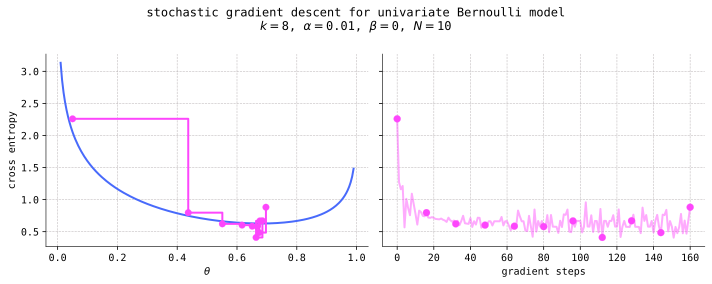

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import torch
import torch.nn.functional as F
import torch.nn as nn
from math import sqrt
from math_stats_ml.gd import SGD, plot_gd
import warnings
import matplotlib_inline.backend_inline
import matplotlib.colors as clr
plt.style.use('../aux-files/custom_style_light.mplstyle')
matplotlib_inline.backend_inline.set_matplotlib_formats('svg')
warnings.filterwarnings('ignore', category=UserWarning)
blue = '#486AFB'
magenta = '#FD46FC'

# generate data
torch.manual_seed(42)
m = 128
X = torch.bernoulli(torch.tensor([0.65] * m))

# define model surprisal function
def I_model(theta, X):
    return -X * torch.log(theta) - (1 - X) * torch.log(1 - theta)

def J(theta):
    return (-X * np.log(theta) - (1 - X) * np.log(1 - theta)).mean()

# initialize parameters
parameters = torch.tensor([0.05])

# choose SGD hyperparameters
alpha = 0.01
k = 8
N = 10

# run SGD
gd_output = SGD(L=I_model, init_parameters=parameters, X=X, lr=alpha, batch_size=k, num_epochs=N)

epoch_step_nums = gd_output.epoch_step_nums
objectives = gd_output.per_step_objectives[epoch_step_nums]
running_parameters = gd_output.parameters['theta']
running_parameters = running_parameters[epoch_step_nums]
grid = np.linspace(start=0.01, stop=0.99, num=200)
y = np.apply_along_axis(J, axis=1, arr=grid.reshape(-1, 1))

_, axes = plt.subplots(ncols=2, figsize=(10, 4), sharey=True)

axes[0].plot(grid, y)
axes[0].step(running_parameters, objectives, where='post', color=magenta)
axes[0].scatter(running_parameters, objectives, color=magenta, s=45, zorder=3)
axes[0].set_xlabel('$\\theta$')
axes[0].set_ylabel('cross entropy')

axes[1].plot(range(len(gd_output.per_step_objectives)), gd_output.per_step_objectives, color=magenta, alpha=0.45)
axes[1].scatter(epoch_step_nums, objectives, s=50, color=magenta, zorder=3)
axes[1].set_xlabel('gradient steps')

plt.suptitle(f'stochastic gradient descent for univariate Bernoulli model\n$k=${k}, $\\alpha =${alpha}, $\\beta=$0, $N = ${N}')
plt.tight_layout()

The blue curve in the left-hand plot is the graph of the _exact_ cross entropy function $H_{\hat{P}}(P_\theta)$. The magenta points---which represent a selection of outputs of the algorithm---do not fall _precisely_ on this graph since they are _approximations_ to the cross entropy, obtained as realizations of the expression on the right-hand side of

$$
H_{\hat{P}}(P_\theta) \approx \frac{1}{8} \sum_{x\in B} \calI(\theta; x),
$$

where $B$ is a mini-batch of data of size $k=8$. (This was discussed right after we introduced {prf:ref}`sgd-alg` in {numref}`Chapter %s <optim>`.) On the right-hand size of the figure, we have plotted the (approximate) cross entropy versus gradient steps, a type of plot familiar from {numref}`Chapter %s <optim>`. The magenta dots on the two sides of the figure correspond to each other; they represent the (approximate) cross entropies every 16 gradient steps ($=1$ epoch). Notice that the algorithm appears to be converging to the true value $\theta^\star_\text{MLE} = 87/128 \approx 0.68$ given by {prf:ref}`bern-mle-thm`.












(gen-mle-sec)=
## General MLE

```{margin}

One should also further distinguish between the cases that the PGM contains hidden (or latent) variables, or whether all variables are visible. We shall only focus on the latter case (so-called _fully-observed models_) since the training process for models with hidden variables requires a different set of algorithms. (For example, the [expectation maximation algorithm](https://en.wikipedia.org/wiki/Expectation%E2%80%93maximization_algorithm).)
```

Maximum likelihood estimation works for all the probabilistic graphical models that we studied in {numref}`Chapter %s <prob-models>`, though there are some variations between the different models. First, we must distinguish between training a model as a _generative model_ versus a _discriminative model_. Along with every PGM comes the joint distribution over _all_ random variables, and for a generative model, the learning process trains the model with the goal to learn the parameters of the _entire_ joint distribution, while for a discriminative model, the learning process aims at learning the parameters of only a conditional distribution. Of the types of models explicitly studied in {numref}`Chapter %s <prob-models>`---linear regression models, logistic regression models, and neural networks---all three are trained as discriminative models, aiming to learn the parameters of the conditional distributions of the response variable $Y$ given the predictor vector $\bX$. On the other hand, both the univariate Bernoulli model in the previous section and the Naive Bayes model---studied in the [programming assignment](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_12.ipynb) for {numref}`Chapter %s <prob-models>`, as well as the [worksheet](https://github.com/jmyers7/stats-book-materials/blob/main/worksheets/13-learning.pdf) for the current chapter---are trained as generative models.

We begin our discussion with the case of generative models, since it is essentially just a recapitulation of our discussion of the univariate Bernoulli model in the previous section. If such a model consists of $n$ random variables, say $X_1,X_2,\ldots,X_n$, then we will write them as an $n$-dimensional random vector

$$
\bX = (X_1,X_2,\ldots,X_n).
$$

For simplicity, we will assume that $\bX$ is discrete, so that if $\btheta$ is the parameter vector for the model, we have a joint mass function $p(\bx;\btheta)$. Then the same definitions given in the previous section for the univariate Bernoulli model apply here:

```{prf:definition}
:label: gen-model-functions-def

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector.

1. For fixed $\bx\in \bbr^n$, the _model likelihood function_ is given by

    $$
    \calL(\btheta;\bx) \def p(\bx; \btheta),
    $$
    
    thought of as a function of $\btheta$. The _model surprisal function_ is given by

    $$
    \calI(\btheta;\bx) \def -\log \left[ \calL(\btheta;\bx) \right] = -\log \left[p(\bx; \btheta) \right],
    $$

    also thought of as a function of $\btheta$.

2. For a fixed, observed dataset $\bx_1,\bx_2,\ldots,\bx_m\in \bbr^n$, the _data likelihood function_ is given by

    $$
    \calL(\btheta;\bx_1,\ldots,\bx_m) \def p(\bx_1,\ldots,\bx_m; \btheta),
    $$

    thought of as a function of $\btheta$. The _data surprisal function_ is given by

    $$
    \calI(\btheta;\bx_1,\ldots,\bx_m) \def -\log \left[ \calL(\btheta;\bx_1,\ldots,\bx_m) \right] = -\log \left[p(\bx_1,\ldots,\bx_m; \btheta) \right],
    $$

    also thought of as a function of $\btheta$.
```

Sometimes, if mentioning the specific observation $\bx$ or the observed dataset $\bx_1,\bx_2,\ldots,\bx_m$ is not important, we will write the functions in the definition as

$$
\calL_\text{model}(\btheta), \quad \calI_\text{model}(\btheta), \quad \calL_\text{data}(\btheta), \quad \calI_\text{data}(\btheta).
$$

```{admonition} Problem Prompt

Do problem 1 on the worksheet.
```

Since observed datasets are assumed to be observations of IID random samples, we have:

```{prf:theorem} Data likelihood/surprisal $=$ product/sum of model likelihood/surprisal
:label: likelihood-sur-decompose-thm

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector. If

$$
\bx_1,\bx_2,\ldots,\bx_m\in \bbr^n
$$

is an observed dataset, then we have

$$
\calL_\text{data}(\btheta) = \prod_{i=1}^m \calL(\btheta; \bx_i) \quad \text{and} \quad \calI_\text{data}(\btheta) = \sum_{i=1}^m \calI(\btheta; \bx_i).
$$
```

Now, we state a version of {prf:ref}`equiv-obj-bern-thm` that holds for generative models:


```{prf:theorem} Equivalent learning objectives for generative PGMs
:label: equiv-obj-gen-thm

Consider a PGM trained as a generative model containing the random variables $\bX = (X_1,X_2,\ldots,X_n)$, and let $\btheta$ be the parameter vector. Let

$$
\bx_1,\bx_2,\ldots,\bx_m \in \bbr^n
$$

be an observed dataset, let $P_\btheta$ be the model joint probability distribution, and let $\hat{P}$ be the empirical distribution of the dataset. The following optimization objectives are equivalent:

1. Minimize the KL divergence $D(\hat{P} \parallel P_\btheta)$ with respect to $\btheta$.
2. Minimize the cross entropy $H_{\hat{P}}(P_\btheta)$ with respect to $\btheta$.
3. Minimize the data surprisal function $\calI(\btheta; \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
4. Maximize the data likelihood function $\calL(\btheta; \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
```

The proof of the equivalence of these training objectives is the same as the proof in the special case of the univariate Bernoulli model in the previous section. The optimization process which seeks a solution to these (equivalent) optimization problems is called _maximum likelihood estimatation_ (_MLE_), and any solution is called a _maximum likelihood estimate_ (also _MLE_) and is denoted $\btheta_\text{MLE}^\star$.

We now turn toward discriminative models, which include all those models explicitly studied in {numref}`Chapter %s <prob-models>`. In this case, we must further distinguish between the models with discrete response variable $Y$ versus a continuous one. Linear regression models are examples of the latter type, while we also briefly encountered an example of a neural network model with continuous $Y$ in the worksheet to {numref}`Chapter %s <prob-models>`. For both of these models, the response variable $Y$ was actually _normally_ distributed (conditionally), so this will be the only case of continuous $Y$ that we consider in this book.

```{prf:definition}
:label: disc-model-functions-def

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$.

1. For fixed $\bx\in \bbr^n$, the _model likelihood function_ is given either by

    $$
    \calL(\btheta; \ y\mid \bx) \def p(y\mid \bx;\  \btheta) \quad \text{or} \quad \calL(\btheta; \ y\mid \bx) \def f(y\mid \bx;\  \btheta),
    $$

    depending on whether $Y$ is (conditionally) discrete or continuous. The model likelihood function is thought of as a function of $\btheta$. The _model surprisal function_ is given by

    $$
    \calI(\btheta; \ y\mid \bx) \def -\log \left[ \calL(y\mid \btheta; \ \bx) \right],
    $$

    also thought of as a function of $\btheta$.

2. For a fixed, observed dataset

    $$
    (\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m)\in \bbr^n \times \bbr,
    $$
    
    the _data likelihood function_ is given either by

    $$
    \calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m) \def p(y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m; \ \btheta)
    $$

    or

    $$
    \calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m) \def f(y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m; \ \btheta)
    $$
    
    depending on whether $Y$ is (conditionally) discrete or continuous. The data likelihood function is thought of as a function of $\btheta$. The _data surprisal function_ is given by

    $$
    \calI(\btheta;\ y\mid \bx_1,\ldots,\bx_m) \def -\log \left[ \calL(\btheta; \ y\mid \bx_1,\ldots,\bx_m) \right],
    $$

    also thought of as a function of $\btheta$.
```

As with generative models, if mentioning the specific observation or the observed dataset is not important, we will write the functions in the definition as

$$
\calL_\text{model}(\btheta), \quad \calI_\text{model}(\btheta), \quad \calL_\text{data}(\btheta), \quad \calI_\text{data}(\btheta).
$$

From independence, we also get the analog of {prf:ref}`likelihood-sur-decompose-thm`:

```{prf:theorem} Data likelihood/surprisal $=$ product/sum of model likelihood/surprisal
:label: likelihood-sur-decompose-disc-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$. If

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m)\in \bbr^n \times \bbr
$$

is an observed dataset, then we have

$$
\calL_\text{data}(\btheta) = \prod_{i=1}^m \calL(\btheta; \ y_i \mid \bx_i) \quad \text{and} \quad \calI_\text{data}(\btheta) = \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i).
$$
```

Just as for generative models, for discriminative models we have the stochastic objective function

$$
J(\btheta) \def E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i),
$$

```{margin}

For reasons of space and time, we did not study _conditional_ information-theoretic measures in {numref}`Chapter %s <information-theory>`. For a discussion of these quantities, see {cite}`CoverThomas2006`.
```

where $\hat{p}(\bx,y)$ is the empirical joint mass function of an observed dataset. For generative models, this function was exactly the cross entropy from the empirical distribution to the model distribution---but for discriminative models, it has a different interpretation. In the case that $Y$ is discrete, it is actually a type of _conditional_ cross entropy, and minimizing this objective is the same as minimizing the _conditional_ KL divergence. In the case that $Y$ is conditionally normal, the objective $J(\btheta)$ "is" the _mean squared error_ (or _MSE_), which we first encountered in the [programming assignment](https://github.com/jmyers7/stats-book-materials/blob/main/programming-assignments/assignment_12.ipynb) for the previous chapter. We say that it "is" the MSE, with quotation marks, because it's not _quite_ equal to the MSE on the nose---this is explained precisely in the following result:

```{prf:theorem} Mean squared error as a stochastic objective function
:label: MSE-min-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, parameter vector $\btheta$, and let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset with empirical joint mass function $\hat{p}(\bx,y)$. Suppose also that the conditional distribution of $Y$ given $\bX$ is normal, with _fixed_ variance $\sigma^2$, and that the mean $\mu = \mu(\btheta,\bx)$ of the distribution is given by the link function at $Y$. Then the minimizers of the stochastic objective function

$$
E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i)
$$

are the same as the minimizers of the mean squared error

$$
MSE(\btheta) \def \frac{1}{m} \sum_{i=1}^m (y_i - \mu_i)^2,
$$

where $\mu_i = \mu(\btheta,\bx_i)$.
```

```{prf:proof}

The proof begins with a simple computation:

\begin{align*}
\calI(\btheta; \ y_i \mid \bx_i) &= - \log \left\{ \frac{1}{\sqrt{2\pi \sigma^2}} \exp \left[- \frac{1}{2\sigma^2} (y_i - \mu_i)^2 \right] \right\} \\
&= \frac{1}{2} \log{\left(2\pi \sigma^2\right)} + \frac{1}{2\sigma^2} (y_i - \mu_i)^2.
\end{align*}

Then

$$
\frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i) = \frac{1}{2}\log\left(2\pi \sigma^2\right) + \frac{1}{2m\sigma^2} \sum_{i=1}^m (y_i - \mu_i)^2.
$$

Assuming that the variance $\sigma^2$ is _fixed_, we immediately see that minimizing the left-hand side with respect to $\btheta$ is the same as minimizing the MSE. Q.E.D.
```

In the case addressed by the theorem, we see that the loss function of the stochastic objective function

$$
J(\btheta) = E_{(\bx,y) \sim \hat{p}(\bx,y)}\left[ \calI(\btheta; \ y \mid \bx)\right]
$$

may be replaced with the _squared error_ function $L(\btheta; \ y\mid \bx) = (y-\mu)^2$, and doing so does not alter the solutions to the optimization problem. Moreover, since multiplying a loss function by a positive constant does not change the extremizers, we may modify the squared error function in several ways to best suit the context. For example, sometimes it is convenient to instead take $J(\btheta)$ to be half the _residual sum of squares_:

$$
J(\btheta) = RSS(\btheta) /2 = \frac{1}{2} \sum_{i=1}^m (y_i - \mu_i)^2.
$$

See, for example, {prf:ref}`mle-lin-reg-thm` in the next section.

Our discussion on the identity of the stochastic objective function $J(\btheta)$ is summarized in the following chart:

```{image} ../img/flow-training.svg
:width: 100%
:align: center
```
&nbsp;

Along the bottom of the figure, we've listed the loss functions $L$ of the stochastic objective functions $J$.

We may now state the following theorem, which is a version of {prf:ref}`equiv-obj-gen-thm` for discriminative models:

```{prf:theorem} Equivalent learning objectives for discriminative PGMs
:label: equiv-obj-disc-thm

Consider a PGM trained as a discriminative model with predictor vector $\bX$, response variable $Y$, and parameter vector $\btheta$. Let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset, with empirical joint mass function $\hat{p}(\bx,y)$. The following optimization objectives are equivalent:

1. Minimize the stochastic objective function

    $$
    J(\btheta) \def E_{(\bx, y) \sim \hat{p}(\bx, y)} \left[ \calI(\btheta; \ y \mid \bx) \right] = \frac{1}{m} \sum_{i=1}^m \calI(\btheta; \ y_i \mid \bx_i)
    $$

    with respect to $\btheta$.
2. Minimize the data surprisal function $\calI(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
3. Maximize the data likelihood function $\calL(\btheta; \ y_1,\ldots,y_m \mid \bx_1,\ldots,\bx_m)$ with respect to $\btheta$.
```

Just as for generative models, the optimization process which seeks a solution to these (equivalent) optimization problems is called _maximum likelihood estimation_ (_MLE_), and any solution is called a _maximum likelihood estimate_ (also _MLE_) and is denoted $\btheta_\text{MLE}^\star$.














(mle-lin-reg-sec)=
## MLE for linear regression

Having studied maximum likelihood estimation in general, we now turn toward specific examples, beginning with linear regression models. These are trained as discriminative models with a response variable $Y$ which is (conditionally) normal. If we assume that the variance parameter $\sigma^2$ is _fixed_, then the underlying graph of the model is of the form

&nbsp;
```{image} ../img/log-reg-00.svg
:width: 35%
:align: center
```
&nbsp;

where $\beta_0 \in \bbr$ and $\bbeta \in \mathbb{R}^{n}$ are the only parameters. The link function at $Y$ is still given by

$$
Y \mid \bX  \sim \mathcal{N}(\mu, \sigma^2), \quad \text{where} \quad \mu = \beta_0 + \bx^\intercal \bbeta.
$$

For these models, it turns out MLEs are obtainable in closed form. To derive these expressions, it will be convenient to rewrite the link function $\mu = \beta_0 + \bx^\intercal \bbeta$ as

$$
\mu = \bx^\intercal \btheta,
$$ (mod-link-eq)

where we append an extra coordinate $x_0=1$ to the feature vector $\bx$ and write

$$
\bx^\intercal = (x_0,x_1,\ldots,x_n) = (1,x_1,\ldots,x_n).
$$

We may then combine the bias term $\beta_0$ and the weight vector $\bbeta$ into a single $(n+1)$-dimensional parameter vector

$$
\btheta^\intercal = (\beta_0,\bbeta) = (\beta_0,\beta_1,\ldots,\beta_n),
$$

so that the link function is indeed given by the simple expression {eq}`mod-link-eq`.


```{prf:theorem} MLEs for linear regression models with known variance
:label: mle-lin-reg-thm

Consider a linear regression model with _fixed_ variance $\sigma^2$, and let

$$
(\bx_1,y_1),(\bx_2,y_2),\ldots,(\bx_m,y_m) \in \bbr^n \times \bbr
$$

be an observed dataset. Supposing

$$
\bx_i^\intercal= (x_{0i}, x_{i1},\ldots,x_{in}) = (1, x_{i1},\ldots,x_{in})
$$

for each $i=1,\ldots,m$, let

$$
\mathbfcal{X} = \begin{bmatrix}
\leftarrow & \bx_1^\intercal & \rightarrow \\
\vdots & \vdots & \vdots \\
\leftarrow & \bx_m^\intercal & \rightarrow
\end{bmatrix}, \quad \by = \begin{bmatrix} y_1 \\ \vdots \\ y_m \end{bmatrix}, \quad \btheta = \begin{bmatrix} \beta_0 \\ \beta_1 \\ \vdots \\ \beta_n \end{bmatrix}
$$

Provided that the $(n+1) \times (n+1)$ square matrix $\mathbfcal{X}^\intercal \mathbfcal{X}$ is invertible, maximum likelihood estimates for the parameters $\beta_0$ and $\bbeta$ are given by

$$
\btheta_\text{MLE}^\star = \left(\mathbfcal{X}^\intercal \mathbfcal{X}\right)^{-1}\mathbfcal{X}^\intercal \by.
$$
```

```{prf:proof}
As we noted above in the discussion after the proof of {prf:ref}`MSE-min-thm`, the MLE may be obtained as the minimizer of half the residual sum of squares:

$$
J(\btheta) \def RSS(\btheta)/2 = \frac{1}{2} \sum_{i=1}^m (y_i - \mu_i)^2 = \frac{1}{2} \left( \by - \mathbfcal{X}\btheta\right)^\intercal \left( \by - \mathbfcal{X}\btheta\right),
$$

where $\mu_i = \bx_i^\intercal \btheta$ for each $i=1,\ldots,m$. Taking the gradient gives

$$
\nabla J(\btheta) = \nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right) \left( \by - \mathbfcal{X}\btheta\right),
$$

where $\nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right)$ is the gradient matrix of the vector-valued function $\btheta \mapsto \by - \mathbfcal{X} \btheta$. (Remember our definition of the gradient matrix in {prf:ref}`gradient-mat-def` is the _transpose_ of the usual Jacobian matrix!). But it is easy to show that $\nabla_\btheta \left(\by - \mathbfcal{X}\btheta \right) = - \mathbfcal{X}^\intercal$, and so

$$
\nabla J(\btheta) =  -\mathbfcal{X}^\intercal \left( \by - \mathbfcal{X}\btheta\right).
$$ (grad-rss-eq)

Setting the gradient to zero and rearranging gives

$$
\mathbfcal{X}^\intercal \mathbfcal{X} \btheta = \mathbfcal{X}^\intercal \by,
$$

from which the desired equation follows.

The only thing that is left to prove is that we have actually obtained a global minimizer. But this follows from convexity of the objective function $J(\btheta)$, which we may demonstrate by showing the Hessian matrix $\nabla^2 J(\btheta)$ is positive semidefinite (see {prf:ref}`main-convex-multi-thm`). To do this, note that

$$
\nabla^2 J(\btheta) = \nabla(\nabla J)(\btheta) =  \mathbfcal{X} \mathbfcal{X}^\intercal
$$

from {eq}`grad-rss-eq` and {prf:ref}`hess-jac-grad-thm`. But then, given any vector $\bz \in \bbr^{m}$, we have

$$
\bz^\intercal \nabla^2 J(\btheta) \bz = \bz^\intercal \mathbfcal{X} \mathbfcal{X}^\intercal \bz = (\mathbfcal{X}^\intercal\bz)^\intercal \mathbfcal{X}^\intercal \bz = |\mathbfcal{X}^\intercal\bz|^2 \geq 0.
$$

Thus, the Hessian matrix is indeed positive semidefinite. Q.E.D.
```

As we saw in the proof, the maximum likelihood parameter estimates are those that minimize the residual sum of squares $RSS(\btheta)$, which explains why the MLEs are also often called the _ordinary least squares_ (_OLS_) estimates.

It is worth writing out the MLEs in the case of simple linear regression:

```{prf:corollary} MLEs for simple linear regression models with known variance
:label: mle-simple-lin-reg-cor

Let the notation be as in {prf:ref}`mle-lin-reg-thm`, but assume that $\bX$ is $1$-dimensional, equal to a random variable $X$. Then MLEs for the parameters $\beta_0$ and $\beta_1$ are given by

\begin{align*}
(\beta_1)_\text{MLE}^\star &= \frac{\sum_{i=1}^m \left(x_i - \bar{x} \right)\left( y_i - \bar{y} \right)}{\sum_{i=1}^m \left(x_i - \bar{x} \right)^2}, \\
(\beta_0)_\text{MLE}^\star &= \bar{y} - (\beta_1)_\text{MLE}^\star \bar{x},
\end{align*}

where $\bar{x} = \frac{1}{m} \sum_{i=1}^m x_i$ and $\bar{y} = \frac{1}{m} \sum_{i=1}^m y_i$ are the empirical means.
```

```{prf:proof}

First note that

$$
\mathbfcal{X}^\intercal \mathbfcal{X} = \begin{bmatrix} m & m \bar{x} \\ m \bar{x} & \sum_{i=1}^m x_i^2 \end{bmatrix}.
$$

Assuming this matrix has nonzero determinant, we have

$$
\left(\mathbfcal{X}^\intercal \mathbfcal{X} \right)^{-1} = \frac{1}{m \sum_{i=1}^m x_i^2 - m^2 \bar{x}^2} \begin{bmatrix} \sum_{i=1}^m x_i^2 & -m \bar{x} \\ -m \bar{x} & m \end{bmatrix}.
$$

But

$$
\mathbfcal{X}^\intercal \by = \begin{bmatrix} m \bar{y} \\ \sum_{i=1}^m x_i y_i \end{bmatrix},
$$

and so from

$$
\begin{bmatrix} \beta_0 \\ \beta_1 \end{bmatrix} = \btheta =  \left(\mathbfcal{X}^\intercal \mathbfcal{X}\right)^{-1}\mathbfcal{X}^\intercal \by
$$

we conclude

$$
\beta_1 = \frac{\sum_{i=1}^m x_i y_i -m \bar{x}\bar{y} }{ \sum_{i=1}^m x_i^2 - m \bar{x}^2}.
$$

But as you may easily check, we have

$$
\sum_{i=1}^m x_i y_i -m \bar{x}\bar{y}  = \sum_{i=1}^m \left(x_i - \bar{x} \right)\left( y_i - \bar{y} \right)
$$

and

$$
\sum_{i=1}^m x_i^2 - m \bar{x}^2 = \sum_{i=1}^m \left(x_i - \bar{x} \right)^2,
$$

from which the desired equation for $\beta_1$ follows. To obtain the equation for $\beta_0$, note that the equation

$$
\mathbfcal{X}^\intercal \mathbfcal{X} \begin{bmatrix} \beta_0 \\ \beta_1 \end{bmatrix} = \mathbfcal{X}^\intercal \by 
$$

implies $m \beta_0  + m \beta_1 \bar{x} = m \bar{y}$, and so $\beta_0 = \bar{y} - \beta_1 \bar{x}$. Q.E.D.
```

```{admonition} Problem Prompt

Do problem 2 on the worksheet.
```


To illustrate the concepts, let's return yet again to the Ames housing dataset (see the description at the beginning of {numref}`lin-reg-sec`). While in principle we may compute the _exact_ MLEs for a linear regression model on this data, it is amusing to approximate them using stochastic gradient descent (SGD). To do this, however, we must "standardize" the area and price features for numerical stability, which means that we subtract the empirical means and divide by the standard deviations. When we do so, we get a scatter plot that looks like:

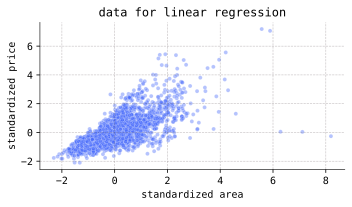

In [2]:
from sklearn.preprocessing import StandardScaler

# import data
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/data-3-1.csv'
df = pd.read_csv(url, usecols=['area', 'price'])

ss = StandardScaler()
data_std = ss.fit_transform(df.to_numpy())

sns.scatterplot(x=data_std[:, 0], y=data_std[:, 1], alpha=0.4)
plt.gcf().set_size_inches(w=5, h=3)
plt.xlabel('standardized area')
plt.ylabel('standardized price')
plt.title('data for linear regression')
plt.tight_layout()

X = torch.tensor(data_std[:, 0], dtype=torch.float32)
y = torch.tensor(data_std[:, 1], dtype=torch.float32)

Notice that both features are on similar scales. Then, we run the algorithm using the squared error function

$$
SE(\btheta; \ x, y) = (y - \beta_0 - \beta x)^2, \quad \btheta = (\beta_0, \beta),
$$

as the loss function for SGD:

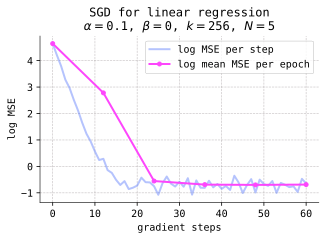

In [3]:
# define link function at Y
def mu_link(parameters, X):
    beta0 = parameters['beta0']
    beta = parameters['beta']
    return beta0 + beta * X

# define the squared error loss function
def SE(parameters, X, y):
    mu = mu_link(parameters, X)
    return (y - mu) ** 2

# initialize parameters
beta0 = torch.tensor([-10.])
beta = torch.tensor([3.])
parameters = {'beta0': beta0, 'beta': beta}

# choose SGD hyperparameters
alpha = 0.1
N = 5
k = 256

# run SGD
gd_output = SGD(L=SE, init_parameters=parameters, X=X, y=y, lr=alpha, batch_size=k, num_epochs=N, random_state=42)

# plot SGD output
plot_gd(gd_output,
         log=True,
         ylabel='log MSE',
         plot_title_string='SGD for linear regression',
         h=3,
         per_step_label='log MSE per step',
         per_epoch_label='log mean MSE per epoch',
         per_epoch_color=magenta,
         legend=True,
         per_step_alpha=0.4)

Notice that we plotted the logarithm of the MSE---we chose to do this because we purposefully chose initial guesses for the parameters $\beta_0$ and $\beta$ that were quite far away from the MLEs, creating large values of the MSE in the initial few steps of the algorithm. This lengthens the learning process, giving us a nicer visualization as the regression line moves into place:

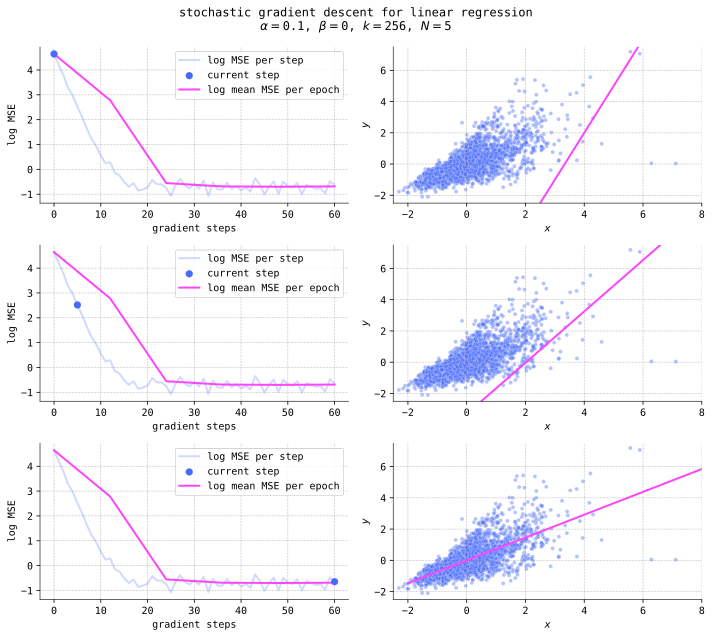

In [4]:
grid = np.linspace(-2, 8, num=200)
epoch_list = [0, 5, len(gd_output.per_step_objectives) - 1]

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {name: parameter[epoch] for name, parameter in gd_output.parameters.items()}

    # plot the objective function
    axes[i, 0].plot(gd_output.grad_steps, np.log(gd_output.per_step_objectives), alpha=0.25, label='log MSE per step')
    axes[i, 0].scatter(epoch_list[i], np.log(gd_output.per_step_objectives[epoch]), color=blue, s=50, zorder=3, label='current step')
    axes[i, 0].plot(gd_output.epoch_step_nums, np.log(gd_output.per_epoch_objectives), label='log mean MSE per epoch')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('log MSE')
    axes[i, 0].legend()

    sns.scatterplot(x=data_std[:, 0], y=data_std[:, 1], alpha=0.4, ax=axes[i, 1])
    axes[i, 1].plot(grid, mu_link(parameters, grid), color=magenta)
    axes[i, 1].set_xlabel('$x$')
    axes[i, 1].set_ylabel('$y$')
    axes[i, 1].set_ylim(-2.5, 7.5)
    axes[i, 1].set_xlim(-2.5, 8)

plt.suptitle(f'stochastic gradient descent for linear regression\n$\\alpha=${alpha}, $\\beta=$0, $k=${k}, $N=${N}')
plt.tight_layout()

(mle-log-reg-sec)=
## MLE for logistic regression

Let's now turn toward the training process for logistic regression models via maximum likelihood estimation. In contrast to linear regression models, the MLEs are not obtainable in closed form in general, and thus we must apply the optimization algorithms studied in {numref}`Chapter %s <optim>`. However, not all good properties are lost, because it turns out that the objective functions in these optimization problems are convex. Our main goal in this section is to establish this fundamental fact.

But first, we will extract the formula for the model likelihood function of a logistic regression model from {prf:ref}`log-reg-data-pf-thm` and apply the negative logarithm function to get:

```{prf:theorem} Surprisal functions of logistic regression models
:label: log-reg-surprisal-thm

Consider a logistic regression model with predictor vector $\bX$, response variable $Y$, and link function at $Y$ given by

$$
Y \mid \bX \sim \Ber(\phi) \quad \text{where} \quad \phi = \sigma(\beta_0 + \bx^\intercal \bbeta),
$$

where $\sigma$ is the sigmoid function. Then the model surprisal function is given by

$$
\calI_\text{model}(\btheta) = -y \log{\phi} - (1-y) \log(1-\phi).
$$
```

To establish convexity of the MLE problem for logistic regression models, we need to have formulas for the gradient vector and Hessian matrix of the data surprisal function. To obtain these formulas, it will be convenient to adopt the notation described at the beginning of the previous section regarding the addition of an extra coordinate $x_0=1$ to a feature vector $\bx\in \bbr^n$ to create

$$
\bx^\intercal = (x_0,x_1,\ldots,x_n) = (1,x_1,\ldots,x_n).
$$ (new-x-eq)

Then the link function in a logistic regression model may be written as $\phi = \sigma(\bx^\intercal \btheta)$, where

$$
\btheta^\intercal = (\beta_0,\bbeta) = (\beta_0,\beta_1,\ldots,\beta_n)
$$ (new-theta-eq)

We now compute the gradient and Hessian:

```{prf:theorem} Gradient vectors and Hessian matrices for logistic regression models
:label: log-reg-surprisal-grad-thm

Consider a logistic regression model with predictor vector $\bX$, response variable $Y$, and link function at $Y$ given by

$$
Y \mid \bX \sim \Ber(\phi) \quad \text{where} \quad \phi = \sigma(\bx^\intercal \btheta),
$$

where $\bx$ and $\btheta$ are given by {eq}`new-x-eq` and {eq}`new-theta-eq` above. Then the gradient vector and Hessian matrix of the model surprisal function are given by

$$
\nabla \calI_\text{model}(\btheta) = (\phi -y)\bx \quad \text{and} \quad \nabla^2 \calI_\text{model}(\btheta) = \phi(1-\phi) \bx \bx^\intercal.
$$

```

```{prf:proof}

For the gradient vector, we compute

\begin{align*}
\nabla \calI &= \left(-\frac{y}{\phi}  + \frac{1-y}{1-\phi}\right) \nabla \phi \\
&= \left(-\frac{y}{\phi}  + \frac{1-y}{1-\phi}\right) \phi(1-\phi) \bx \\
&= (\phi - y) \bx
\end{align*}

where the equality $\nabla \phi = \phi(1-\phi)\bx$ follows from [this](https://github.com/jmyers7/stats-book-materials/blob/main/homework/12-homework.md#problem-8-the-derivative-of-the-sigmoid-function) homework problem and the chain rule. Then, for the Hessian matrix, we compute:

\begin{align*}
\nabla^2 \calI&= \nabla\left( \nabla \calI \right) \\
&= \nabla (\phi \bx) \\
&= \begin{bmatrix}
\uparrow & \cdots & \uparrow \\
x_0 \nabla(\phi) & \cdots & x_n \nabla(\phi) \\
\downarrow & \cdots & \downarrow 
\end{bmatrix} \\
&= \phi(1-\phi)  \begin{bmatrix}
\uparrow & \cdots & \uparrow \\
x_0 \bx & \cdots & x_n \bx \\
\downarrow & \cdots & \downarrow
\end{bmatrix} \\
&= \phi(1-\phi) \bx \bx^\intercal,
\end{align*}

where we used {prf:ref}`hess-jac-grad-thm` in the first equality. Q.E.D.
```

An immediate corollary is convexity of the optimization problem:

```{prf:corollary} Logistic regression models $\Rightarrow$ convex optimization problems
:label: log-reg-convex-cor

Both the model and data surprisal functions of a logistic regression model are convex.
```

```{prf:proof}

Letting $\bz\in \bbr^{n+1}$ be an arbitrary vector, we have

$$
\bz^\intercal \nabla^2 \calI_\text{model}(\btheta) \bz = \phi(1-\phi) \bz^\intercal \bx \bx^\intercal \bz = \phi(1-\phi) (\bx^\intercal \bz)^\intercal \bx^\intercal \bz = \phi(1-\phi) |\bx^\intercal \bz|^2 \geq 0,
$$

since $\phi \in (0,1)$. This shows the Hessian matrix of the model surprisal function is positive semidefinite, and thus by {prf:ref}`main-convex-multi-thm`, it is convex. For the data surprisal function, we note that

$$
\calI_\text{data}(\btheta) = \sum_{i=1}^m \calI_\text{model}(\btheta; \ y_i \mid \bx_i)
$$

by {prf:ref}`likelihood-sur-decompose-disc-thm`. Then convexity of $\calI_\text{data}$ follows from linearity of the "Hessian matrix operation," along with the observation that a sum of positive semidefinite matrices is positive semidefinite. Q.E.D.
```

Convexity of the optimization problem opens doors for other algorithms besides gradient descent, like the [Newton-Raphson algorithm](https://en.wikipedia.org/wiki/Newton%27s_method).

Let's bring back the dataset from {numref}`log-reg-sec`:

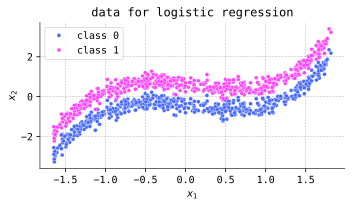

In [5]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-01.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.title('data for logistic regression')
plt.tight_layout()

Let's train a logistic regression model on this dataset using the SGD algorithm to locate the global minimizer of the cross entropy from the model distribution to the empirical distribution. This requires the model surprisal function as the loss function for SGD. Running the algorithm for 30 epochs results in the following plot of cross entropy versus gradient steps:

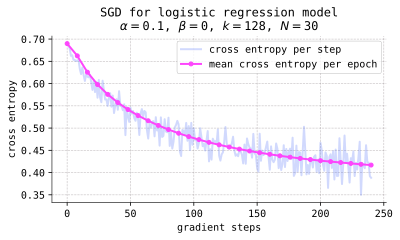

In [6]:
# define link function at Y
def phi_link(parameters, X):
    beta0 = parameters['beta0']
    beta = parameters['beta']
    return torch.sigmoid(beta0 + X @ beta)

# define the model surprisal function
def I_model(parameters, X, y):
    phi = phi_link(parameters, X)
    return -y * torch.log(phi) - (1 - y) * torch.log(1 - phi)

# initialize parameters
torch.manual_seed(42)
beta0 = torch.normal(mean=0, std=1e-1, size=(1,))
beta = torch.normal(mean=0, std=1e-1, size=(2,))
parameters = {'beta0': beta0, 'beta': beta}

# define SGD parameters
N = 30
k = 128
alpha = 1e-1

# run SGD
gd_output = SGD(L=I_model, X=X, y=y, init_parameters=parameters, lr=alpha, num_epochs=N, batch_size=k)

# plot SGD
plot_gd(gd_output,
        h=3,
        w=6,
        plot_title_string='SGD for logistic regression model',
        ylabel='cross entropy',
        legend=True,
        per_step_label='cross entropy per step',
        per_epoch_label='mean cross entropy per epoch')

Notice that the curve in this plot is beginning to "plateau," indicating the algorithm is beginning to converge on the MLE. Since the feature space is $2$-dimensional, as we discussed in {numref}`log-reg-sec`, we may check the fit of the model by plotting the decision boundary of the predictor function

$$
h:\bbr^2 \to \{0,1\}, \quad h(\bx) = \begin{cases}
0 & : \phi = \sigma(\beta_0 + \bx^\intercal \bbeta) < 0.5, \\
1 & : \phi = \sigma(\beta_0 + \bx^\intercal \bbeta) \geq 0.5.
\end{cases}
$$

It is interesting to watch this decision boundary move into the optimal position as the training process progresses:

In [7]:
# define the predictor
def predictor(X, parameters):
    phi = phi_link(parameters, X)
    return (phi >= 0.5).to(torch.int)

# define grid for contour plot
resolution = 1000
x1_grid = torch.linspace(-2, 2, resolution)
x2_grid = torch.linspace(-4, 4, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

# define colormap for the contour plots
desat_blue = '#7F93FF'
desat_magenta = '#FF7CFE'
binary_cmap = clr.LinearSegmentedColormap.from_list(name='binary', colors=[desat_blue, desat_magenta], N=2)

epoch_list = [0, 30, len(gd_output.per_step_objectives) - 1]
running_parameters = gd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(gd_output.grad_steps, gd_output.per_step_objectives, alpha=0.25, label='cross entropy per step')
    axes[i, 0].scatter(epoch_list[i], gd_output.per_step_objectives[epoch], color=blue, s=50, zorder=3, label='current step')
    axes[i, 0].plot(gd_output.epoch_step_nums, gd_output.per_epoch_objectives, label='mean cross entropy per epoch')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('cross entropy')
    axes[i, 0].legend()

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.suptitle(f'stochastic gradient descent for logistic regression\n$\\alpha=${alpha}, $\\beta=$0, $N=${N}')
plt.tight_layout()

(mle-nn-sec)=
## MLE for neural networks

In this section, we encounter our third optimization problem of maximum likelihood estimation. These problems have been presented in the chapter in order of increasing difficulty, beginning with the easiest in {numref}`mle-lin-reg-sec` where we discovered that the MLEs for linear regression models are obtainable in closed form _and_ that the optimization problem is convex. For logistic regression models, discussed in {numref}`mle-log-reg-sec`, we lost the ability (in general) to write down closed form solutions for MLEs, but the optimization problem was still convex. Now, in the current section, we lose both of these desirable properties: In general, the optimization problems of maximum likelihood estimation for neural network models have neither closed form solutions nor are they convex.

Thinking visually and using intuition and language adapted from low dimensions, we imagine that the graph of a (strictly) convex objective function $J:\bbr^n \to \bbr$ is a hypersurface embedded in $\bbr^{n+1}$ with a single "lowest valley" (global minimum). The gradient descent algorithms follow the negative gradient "downhill" until they reach a neighborhood of this global minimizer. But for a nonconvex $J$, there might be both local minima and maxima (i.e., local "peaks" and "valleys"), as well as _saddle points_ where the gradient vanishes, but where the Hessian matrix has both negative and positive eigenvalues, resulting in both "upward" and "downward" directional curvatures. This means that it is possible for gradient descent to get "stuck" in a local minimum with relatively high objective value, or that it follows a "downhill" trajectory leading to a saddle point and again gets "stuck" (or at least significantly slowed down). However, intuition suggests at least that local minima are rare in high dimensions since it should require very special circumstances and structure for positivity of _all_ eigenvalues of a Hessian matrix. But saddle points remain a concern.

Parameter initialization is also a significant concern for neural network models. With strictly convex objective functions, convergence of gradient descent to the global minimizer is guaranteed beginning from _all_ initial choices for the parameters, at least if the learning rate is chosen appropriately. But for a completely general nonconvex objective function, convergence guarantees do not exist.

However, the objective functions encountered in training neural network models are _not_ ordinary nonconvex functions---they still retain enough structure that tools and best practices may be developed and utilized to help encourage gradient descent to converge on decent solutions. Our little introduction to neural networks and deep learning in this book is not the place to discuss these in detail---for that, we direct the reader toward specialized treatments given in Chapter 8 of {cite}`GBC2016`, Chapter 7 in {cite}`HardtRecht2022`, and also [here](https://d2l.ai/chapter_optimization/index.html).

We begin by extracting the surprisal function of a neural network (with one hidden layer) from {prf:ref}`neural-net-pf-def`:

```{prf:theorem} Surprisal functions of neural network models
:label: nn-surprisal-thm

Consider a neural network model with a predictor vector $\bX$, response variable $Y$, and link functions given by

$$
\phi = \sigma(\ba^\intercal \bw_2 + b_2) \quad \text{and} \quad \ba^\intercal = \rho(\bx^\intercal \mathbf{W}_1 + \bb_1^\intercal),
$$ (two-links-eq)

where $\sigma$ is the sigmoid function and $\rho$ the ReLU function. Then the model surprisal function is given by

$$
\calI_\text{model}(\bW_1,\bb_1, \bw_2,b_2) = -y \log{\phi} - (1-y) \log(1-\phi).
$$ (nn-surprise-eq)
```

Notice that the expression on the right-hand side of {eq}`nn-surprise-eq` is the same as the expression for the model surprisal function of a logistic regression model given in {prf:ref}`log-reg-surprisal-thm`. The difference between the two expressions manifests in the dependence of $\phi$ on the parameters of the model: For a logistic regression model, we have the simple dependence

$$
\phi = \sigma(\beta_0 + \bx^\intercal\bbeta ),
$$

while for a neural network model the dependence of $\phi$ on the parameters is given by the two link functions {eq}`two-links-eq`.

Now, let's bring back the dataset from {numref}`nn-sec`:

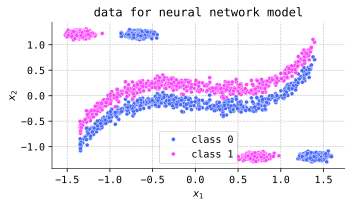

In [8]:
url = 'https://raw.githubusercontent.com/jmyers7/stats-book-materials/main/data/ch12-book-data-02.csv'
df = pd.read_csv(url)

# convert the data to numpy arrays
X = df[['x_1', 'x_2']].to_numpy()
y = df['y'].to_numpy()

# convert the data to torch tensors
X = torch.tensor(data=X, dtype=torch.float32)
y = torch.tensor(data=y, dtype=torch.float32)

# plot the data
g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y')

# change the default seaborn legend
g.legend_.set_title(None)
new_labels = ['class 0', 'class 1']
for t, l in zip(g.legend_.texts, new_labels):
    t.set_text(l)

plt.xlabel('$x_1$')
plt.ylabel('$x_2$')
plt.gcf().set_size_inches(w=5, h=3)
plt.title('data for neural network model')
plt.tight_layout()

We will train a neural network with three hidden layers of widths $8$, $8$, and $4$ to predict the classes of the data in the scatter plot. We will run SGD with the data surprisal function as the loss function, so that the objective is to minimize the (conditional) cross entropy from the model distribution to the empirical distribution:

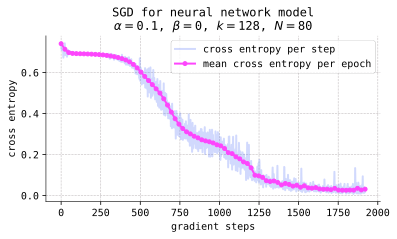

In [9]:
# define link function at Y
def phi_link(parameters, X):

    # initialize the a-value with x
    a = X

    # loop through hidden layers
    for h in range(1, 4):
        W = parameters['weight_' + str(h)]
        b = parameters['bias_' + str(h)]
        a = F.relu(a @ W + b)
    
    # compute link function at output layer
    W = parameters['weight_4']
    b = parameters['bias_4']
    phi = torch.sigmoid(a @ W + b)
    return phi

# define the model surprisal function
def I_model(parameters, X, y):
    phi = phi_link(parameters, X)
    return -y * torch.log(phi) - (1 - y) * torch.log(1 - phi)

# define the network architecture
p1 = 8 # width of first hidden layer
p2 = 8 # width of second hidden layer
p3 = 4 # width of third hidden layer
widths = [2, p1, p2, p3, 1]

# initialize parameters
torch.manual_seed(42)
parameters = {}
for i in range(1, 5):
    weight = torch.empty(widths[i-1], widths[i])
    bias = torch.empty(widths[i])
    nn.init.uniform_(weight, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    nn.init.uniform_(bias, a=-1/sqrt(widths[i-1]), b=1/sqrt(widths[i-1]))
    parameters = parameters | {'weight_' + str(i): weight.squeeze()}
    parameters = parameters | {'bias_' + str(i): bias}

# define SGD parameters
N = 80
k = 128
alpha = 0.1

# run SGD
gd_output = SGD(L=I_model, init_parameters=parameters, X=X, y=y, lr=alpha, batch_size=k, num_epochs=N, random_state=42)

# plot SGD
plot_gd(gd_output,
         h=3,
         w=6,
         plot_title_string='SGD for neural network model',
         ylabel='cross entropy',
         legend=True,
         per_step_label='cross entropy per step',
         per_epoch_label='mean cross entropy per epoch')

The algorithm takes almost $2{,}000$ gradient steps, spread over $N=80$ epochs with a mini-batch size of $k=128$ on a dataset of size $m=3{,}072$.

```{admonition} Problem Prompt

Do problem 3 on the worksheet.
```

Just as we did for the logistic regression model in the previous section, it is interesting to watch the decision boundary of the predictor function move into the optimal position as the training process progresses:

In [10]:
# define the predictor
def predictor(X, parameters):
    phi = phi_link(parameters, X)
    return (phi >= 0.5).to(torch.int)

# get the grid for the contour plot
resolution = 1000
x1_grid = torch.linspace(-1.75, 1.75, resolution)
x2_grid = torch.linspace(-1.5, 1.5, resolution)
x1_grid, x2_grid = torch.meshgrid(x1_grid, x2_grid)
grid = torch.column_stack((x1_grid.reshape((resolution ** 2, -1)), x2_grid.reshape((resolution ** 2, -1))))

epoch_list = [0, 750, len(gd_output.per_step_objectives) - 1]
running_parameters = gd_output.parameters

_, axes = plt.subplots(ncols=2, nrows=len(epoch_list), figsize=(10, 9))

for i, epoch in enumerate(epoch_list):
    parameters = {key: value[epoch] for key, value in running_parameters.items()}
    
    # plot the objective function
    axes[i, 0].plot(gd_output.grad_steps, gd_output.per_step_objectives, alpha=0.25, label='cross entropy per step')
    axes[i, 0].scatter(epoch_list[i], gd_output.per_step_objectives[epoch], color=blue, s=50, zorder=3, label='current step')
    axes[i, 0].plot(gd_output.epoch_step_nums, gd_output.per_epoch_objectives, label='mean cross entropy per epoch')
    axes[i, 0].set_xlabel('gradient steps')
    axes[i, 0].set_ylabel('cross entropy')
    axes[i, 0].legend()

    # apply the fitted model to the grid
    z = predictor(grid, parameters)

    # plot the decision boundary and colors
    z = z.reshape(shape=(resolution, resolution))
    axes[i, 1].contourf(x1_grid, x2_grid, z, cmap=binary_cmap)
    axes[i, 1].set_xlabel('$x_1$')
    axes[i, 1].set_ylabel('$x_2$')

    # plot the data
    g = sns.scatterplot(data=df, x='x_1', y='x_2', hue='y', ax=axes[i, 1])

    # change the default seaborn legend
    g.legend_.set_title(None)
    new_labels = ['class 0', 'class 1']
    for t, l in zip(g.legend_.texts, new_labels):
        t.set_text(l)
    
plt.suptitle(f'stochastic gradient descent for neural network model\n$\\alpha=${alpha}, $\\beta=$0, $k=${k}, $N=${N}')
plt.tight_layout()